In [1]:
import nltk
import pandas as pd
import re
import spacy
nlp = spacy.load('en')
import numpy as np
from fuzzywuzzy import fuzz
import docx2txt
import PyPDF2
from nltk.corpus import stopwords
import string
import numpy as np
from pdfminer.pdfinterp import PDFResourceManager, PDFPageInterpreter
from pdfminer.converter import TextConverter
from pdfminer.layout import LAParams
from pdfminer.pdfpage import PDFPage
from io import StringIO

C:\Users\tejas\Anaconda3\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [2]:

def convertPDFToText(path):
    rsrcmgr = PDFResourceManager()
    retstr = StringIO()
    codec = 'utf-8'
    laparams = LAParams()
    device = TextConverter(rsrcmgr, retstr, laparams=laparams)
    fp = open(path, 'rb')
    interpreter = PDFPageInterpreter(rsrcmgr, device)
    password = ""
    maxpages = 0
    caching = True
    pagenos=set()
    for page in PDFPage.get_pages(fp, pagenos, maxpages=maxpages, password=password,caching=caching, check_extractable=True):
        interpreter.process_page(page)
    fp.close()
    device.close()
    string = retstr.getvalue()
    retstr.close()
    return string

In [20]:
from nltk.corpus import stopwords
import re
def pos(text):
    pos_tags = []
    #text = ' '.join(text)
    for i in text:
        doc = nlp(i)
        temp = []
        for token in doc:
            temp.append((token,token.pos_))
        pos_tags.append(temp)
    return(pos_tags)
def entity(text):
    ent = []
    #text = ' '.join(text)
    for i in text:
        doc = nlp(i)
        temp = []
        for token in doc.ents:
            temp.append((token.text,token.label_))
#             print(doc.ents)
        ent.append(temp)
    return(ent)
def remove_stopwords(word_list):
        # List of Englisg stopwords
        eng_stopwords = stopwords.words('english')
#         nouns = []
#         for item in word_list:
        temp = []
        for word in word_list:
            if word not in eng_stopwords:
                temp.append(word)
#         nouns.append(temp)
        return(temp)
def clean(text):
        # Filter out characters which are not alphabets
    text = re.sub(r'[^a-zA-Z-+ ,@/\']', ' ',text)
    text = re.sub(' +', ' ',text)
        # Coverting to lowercase letters
#     text = text.lower()
    return text

In [4]:
combine_data=pd.DataFrame()

In [ ]:
# extract=convertPDFToText("cv/Aanand D. Naik, M.D. _ People _ Houston, Texas.pdf")

In [ ]:

extract = docx2txt.process("combined new.docx")

In [ ]:
for data in extract.split("\n")[75:]:
#     if len(data)and data:
    print(data)

In [4]:
from docx.api import Document
import pandas as pd

In [5]:
document=Document("combined new.docx")

In [9]:
combine_data=pd.DataFrame()

In [26]:
data=[]
data_1=[]
i=17
for j, row in enumerate(document.tables[i].rows):
#     print(len(document.tables[i].rows))
    if len(document.tables[i].rows)>1: 
#         print("abcd")
        text=(cell.text for cell in row.cells)
        if j==0 :
            keys=tuple(text)
            continue
        row_data=dict(zip(keys,text))
        data.append(row_data)
    elif len(document.tables[i].rows)==1:
#         print("xyz")
        data_1=[[cell.text for cell in row.cells]]
if len(data)>0:
    df=pd.DataFrame(data)
    df.columns=["type_of_formation","post_charged_role","activity","domain_competencies"]
elif len(data_1)>0:
    df=pd.DataFrame(data_1,columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [35]:
data=[]
data_1=[]
i=2
for j, row in enumerate(document.tables[i].rows):
#     print(len(document.tables[i].rows))
    if len(document.tables[i].rows)>1: 
#         print("abcd")
        text=(cell.text for cell in row.cells)
        if j==0 :
            keys=tuple(text)
            continue
        row_data=dict(zip(keys,text))
        data.append(row_data)
    elif len(document.tables[i].rows)==1:
#         print("xyz")
        data_1=[[cell.text for cell in row.cells]]
if len(data)>0:
    df=pd.DataFrame(data)
    df.columns=["type_of_formation","post_charged_role","activity","domain_competencies"]
elif len(data_1)>0:
    df=pd.DataFrame(data_1,columns=["type_of_formation","post_charged_role","activity","domain_competencies"])

In [36]:
df

,type_of_formation,post_charged_role,activity,domain_competencies
0,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."


In [28]:
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [143]:
df

,type_of_formation,post_charged_role,activity,domain_competencies
0,"O/o The Chief\nCommissioner (AR), Customs, Exc...",Additional / Joint\n/ Deputy / Assistant Commi...,CESTAT is the appellate forum in respect of\na...,"Knowledge of Law of GST, Customs and\nlegacy l..."


In [139]:
data=[]
for col in df.columns:
#     print(" ".join(list(set(list(df[col])))))
    data.append(" ".join(list(set(list(df[col])))))
df=pd.DataFrame([data],columns=["type_of_formation","post_charged_role","activity","domain_competencies"])
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")

In [140]:
df

,type_of_formation,post_charged_role,activity,domain_competencies
0,,6. Attends to any other additional charge that...,,


In [141]:
combine_data=combine_data.append(df)
combine_data=combine_data.reset_index(drop="yes")
combine_data

,type_of_formation,post_charged_role,activity,domain_competencies
0,"Directorate General\nof Audit, Headquarters, N...",Post : Principal Director General\n(Pr.DG)/ Di...,Issuance of Audit Action Plan for\nthe Audit C...,Exhaustive\tand\nComprehensive knowledge of GS...
1,,supervision of audits for evolution and\nimpro...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."
2,"of Audit, Headquarters, New Delhi Directorate...",Directorate. with regard to directions of the ...,Assisting the DG in the\nfollowing: -\nIssuanc...,Exhaustive\tand\nComprehensive knowledge of GS...
3,,Role assigned:\n\n1. To assist DG in conductin...,Taking\tsuitable\tmeasures\tfor\ncapacity buil...,"Organizational & inter-\npersonnel\tskills,\nm..."
4,"of Audit, Headquarters, New Delhi Directorate...",Charge : Directorate General of Audit (Hqrs.) ...,Acting under guidance and on behalf\nof ADG.\n...,Exhaustive\tand\nComprehensive knowledge of GS...
5,,,Monitoring of audit performance\nof the Audit ...,"Organizational & inter-\npersonnel\tskills,\nm..."
6,"Directorate General\nof Audit, Headquarters, N...",Post :Deputy / Assistant Director\n\nCharge : ...,1. Acting under the guidance of\nADG / Addl. D...,Knowledge of GST Law\nand Procedure.\nKnowledg...
7,,,,"critical\tthinking,\nteamwork.\nLeadership\tsk..."
8,Zonal Unit Directorate General of Audit,techniques\tand\tfor\tensuring\teffective entr...,Guidance and Supervision for the\npreparation ...,Exhaustive\tand\ncomprehensive knowledge of GS...
9,,Role assigned:\n\nTo guide and provide functio...,Attending MCM at Audit\nCommissionerates falli...,analysis and internal\ncontrol assessment)\nOr...


In [5]:
combine_data=pd.read_excel("dataframe (1).xlsx")

In [6]:
combine_data

,Type of Formation,POST,Post / Charged Role,Activity,Domain Competencies
0,"Directorate General of Audit, Headquarters, Ne...",Post : Principal Director General,(Pr.DG)/ Director General (DG) Charge : Direct...,1.Issuance of Audit Action Plan for the Audit ...,1.Exhaustive and Comprehensive knowledge of GS...
1,"Directorate General of Audit, Headquarters, Ne...",Principal Additional Director,The Pr.ADG/ ADG (Hqrs.) is the assisting head ...,Assisting the DG in the following: -\n1.Issuan...,1.Exhaustive and Comprehensive knowledge of GS...
2,"Directorate General of Audit, Headquarters, Ne...",Post : Additional Director,The Addl. Director/Joint Director supervises\n...,Acting under guidance and on behalf\nof ADG. S...,1.Exhaustive and Comprehensive knowledge of GS...
3,"Directorate General of Audit, Headquarters, Ne...",Post :Deputy / Assistant Director,The Deputy / Assistant Director assists the Ad...,1. Acting under the guidance of ADG / Addl. Di...,1.Knowledge of GST Law and Procedure.\n2.Knowl...
4,Directorate General of Audit Zonal Unit,Post : Principal Additional Director,The Pr. ADG/ ADG is the Administrative head of...,1.Guidance and Supervision for the preparation...,1.Exhaustive and comprehensive knowledge of GS...
5,Directorate General of Audit Zonal Unit,Post : Additional Director (Addl.,The Addl Director/Joint Director supervises th...,To assist the ADG in the following: -\n1.Guida...,1.Exhaustive and comprehensive knowledge of GS...
6,Directorate General of Audit Zonal Unit,Post : Deputy / Assistant Director,The Assistant Director assist the Addl. / Join...,The work done by the Directorate is more of ...,1.Knowledge of GST Law and Procedure.\n2.Knowl...
7,"Commissioner (AR), Customs, Excise and Service...",/ Deputy / Assistant Commissioner (Authorised ...,NaN,CESTAT is the appellate forum in respect of\na...,"1. Knowledge of Law of GST, Customs and\n..."
8,"O/o The Chief Commissioner (AR), Customs, Exci...",Deputy / Assistant Commissioner (Administratio...,NaN,1. Supervising the work relating to admin...,1. Office procedure\n2. General Fina...
9,"O/o The Chief Commissioner (AR), Customs, Exci...",Principal Commissioner / Commissioner,NaN,1. Head of Benches and associated activit...,"1. Knowledge of Law of GST, Customs and\n..."


In [28]:
input_text=" ".join(list(combine_data.domain_competencies))

In [31]:


input_text=clean(input_text)

In [37]:
input_text=pos([clean(text) for text in combine_data.domain_competencies])

In [62]:
input_text=pos([clean(text) for text in combine_data.domain_competencies])
clean_text=[]
for sentence in input_text:
    for pair in sentence:
#         print(pair)
        if pair[1] in ["NOUN","PROPN"]:
            if sentence.index(pair)>0:
#                 print(sentence.index(pair))
                if sentence[sentence.index(pair)-1][1] in ["ADJ"]:
                    combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                    clean_text.append(combine_text)
                
                else:
                    clean_text.append(str(pair[0]))
input_text=" ".join(clean_text)

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS

In [49]:
def generate_word_cloud(dataframe,column_name):
    global input_text
#     input_text=" ".join(list(dataframe[column_name]))
    input_text=pos([clean(str(text)) for text in dataframe[column_name]])
    clean_text=[]
    for sentence in input_text:
        for pair in sentence:
    #         print(pair)
            if pair[1] in ["NOUN","PROPN"]:
                if sentence.index(pair)>0:
    #                 print(sentence.index(pair))
                    if sentence[sentence.index(pair)-1][1] in ["ADJ"]:
                        combine_text=str(sentence[sentence.index(pair)-1][0])+" "+str(pair[0])
                        clean_text.append(combine_text)

                    else:
                        clean_text.append(str(pair[0]))
    input_text=" ".join([text for text in clean_text if text not in ["Knowledge","knowledge","studies","complete","Office","Manual","Procedure","procedure","Skills","skill","Skill","skills",'Rules']])
    input_text=input_text.replace("knowledge","").replace("skills","")
    def plot_cloud(wordcloud):
        plt.figure(figsize=(40, 30))
        plt.imshow(wordcloud) 
        plt.axis("off")
    wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='salmon', colormap='Pastel1', collocations=True, stopwords = STOPWORDS).generate(input_text)

    return(plot_cloud(wordcloud))

In [50]:
combine_data.columns=["type_of_formation","post","post_charged_role","activity","domain_competencies"]

Directorate General of Audit, Headquarters, New Delhi


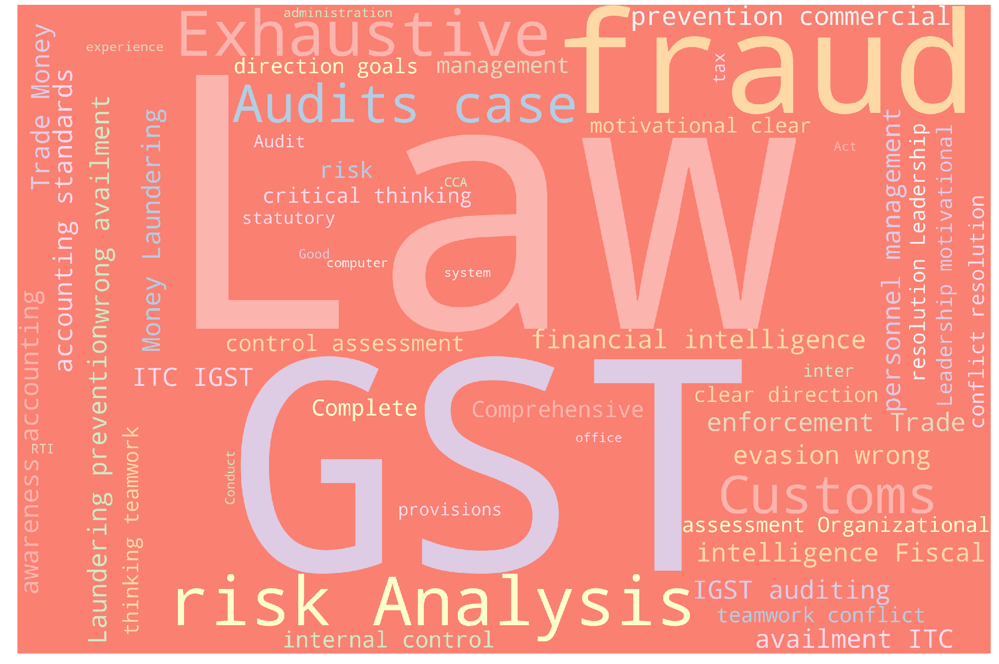

Directorate General of Audit Zonal Unit


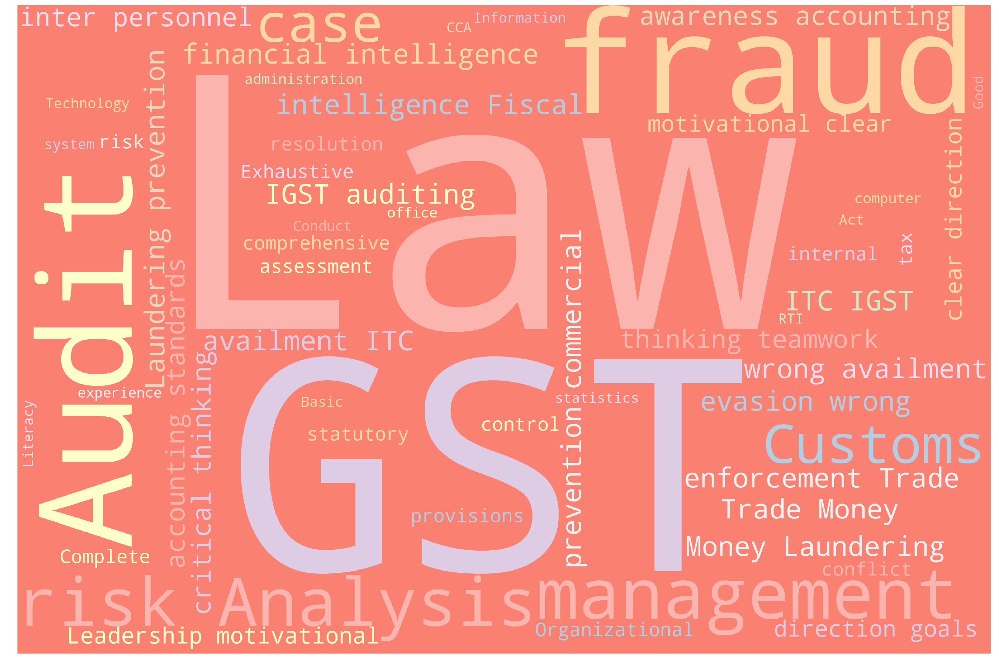

Commissioner (AR), Customs, Excise and Service Tax Appellate Tribunal


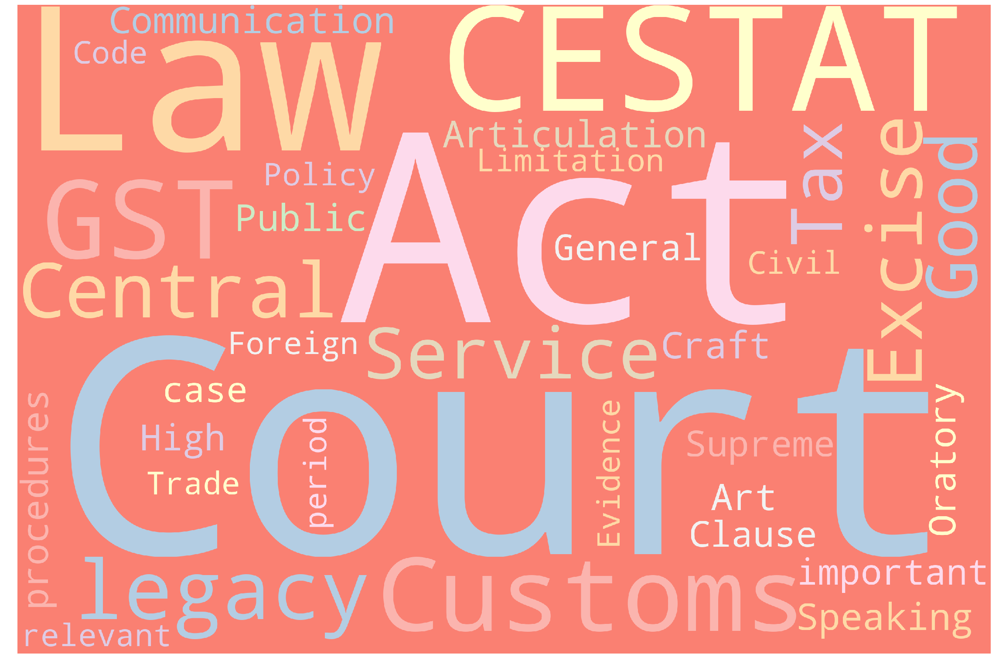

O/o The Chief Commissioner (AR), Customs, Excise and Service Tax Appellate Tribunal


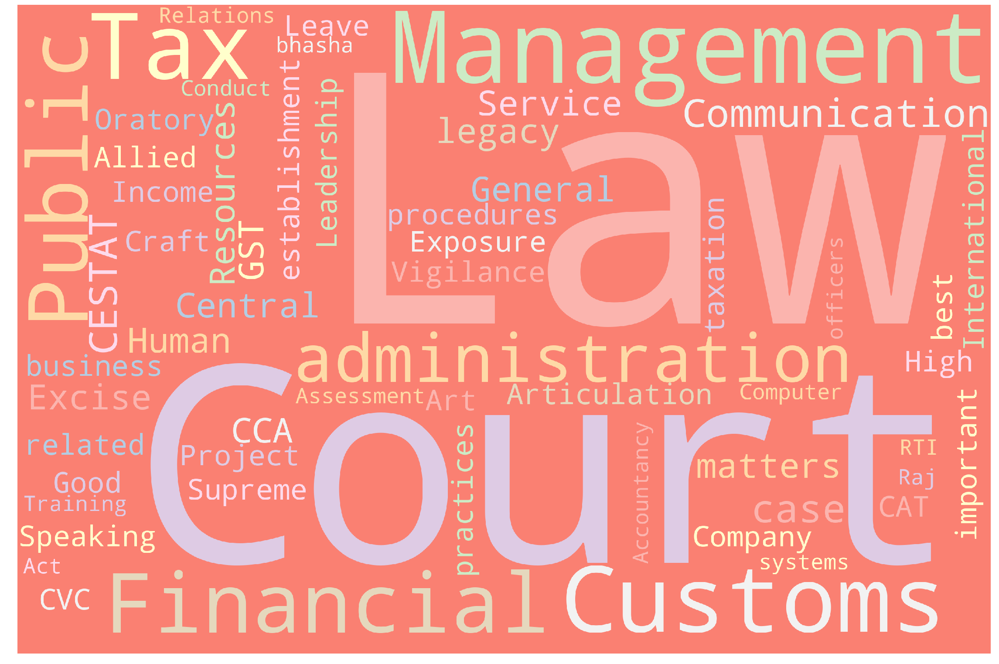

Principal Commissioner (Directorate Of Legal Affairs)


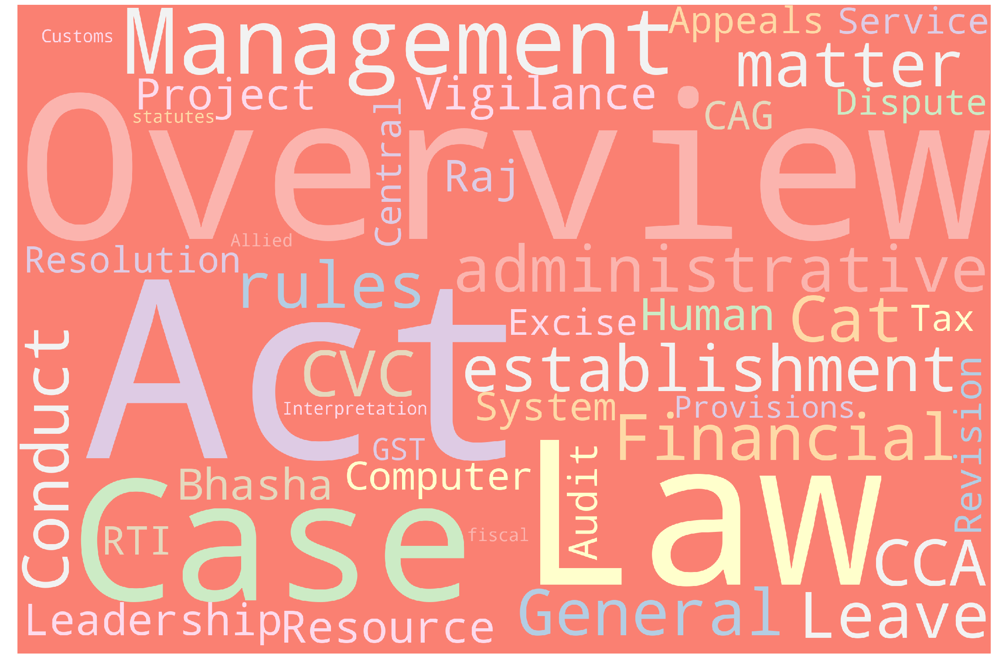

Joint Commissioner/Additional Commissioner (Directorate Of Legal Affairs)


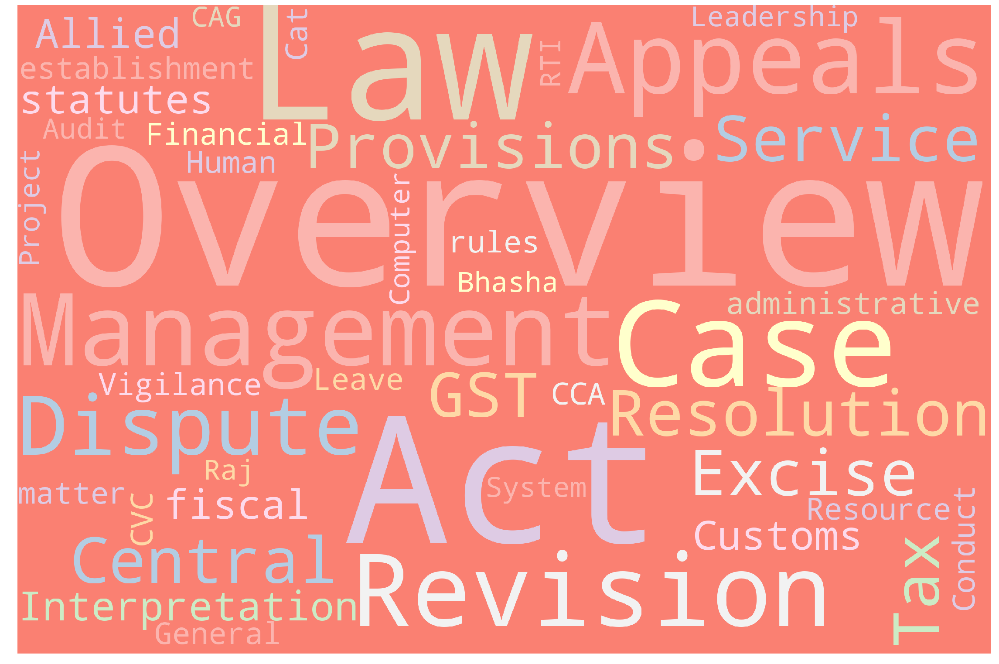

Assistant Commissioner/ Deputy Commissioner (Directorate Of Legal Affairs)


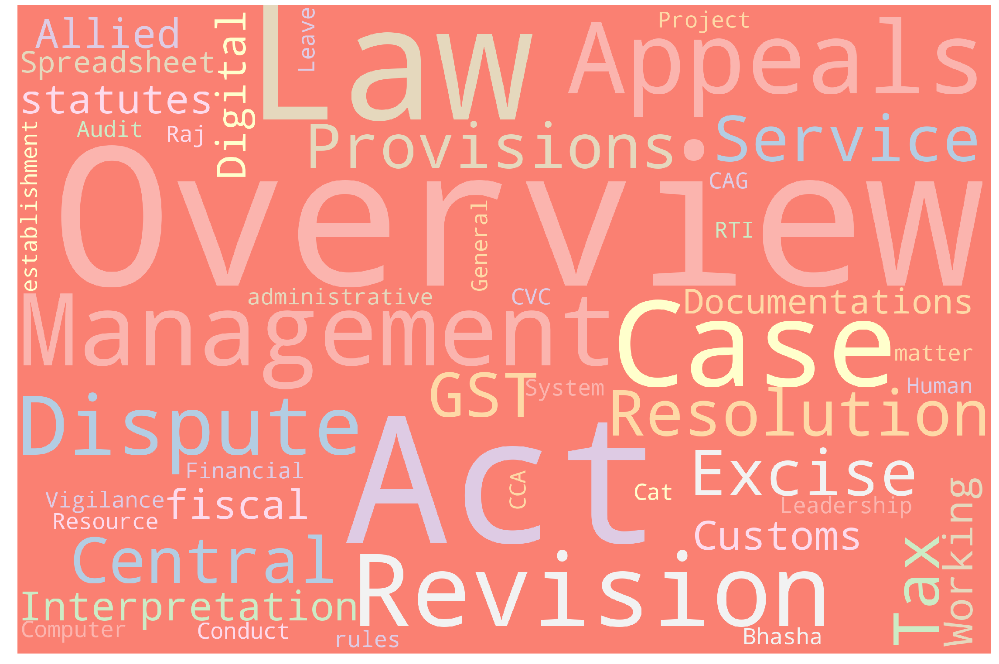

Directorate General of Goods & Services Tax


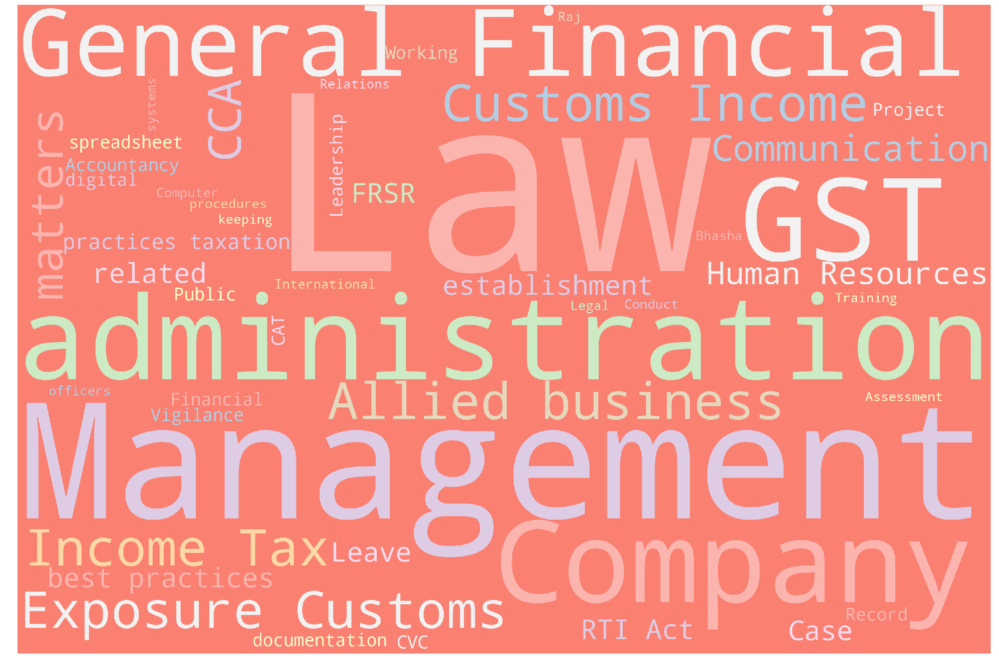

Directorate General of Performance Management


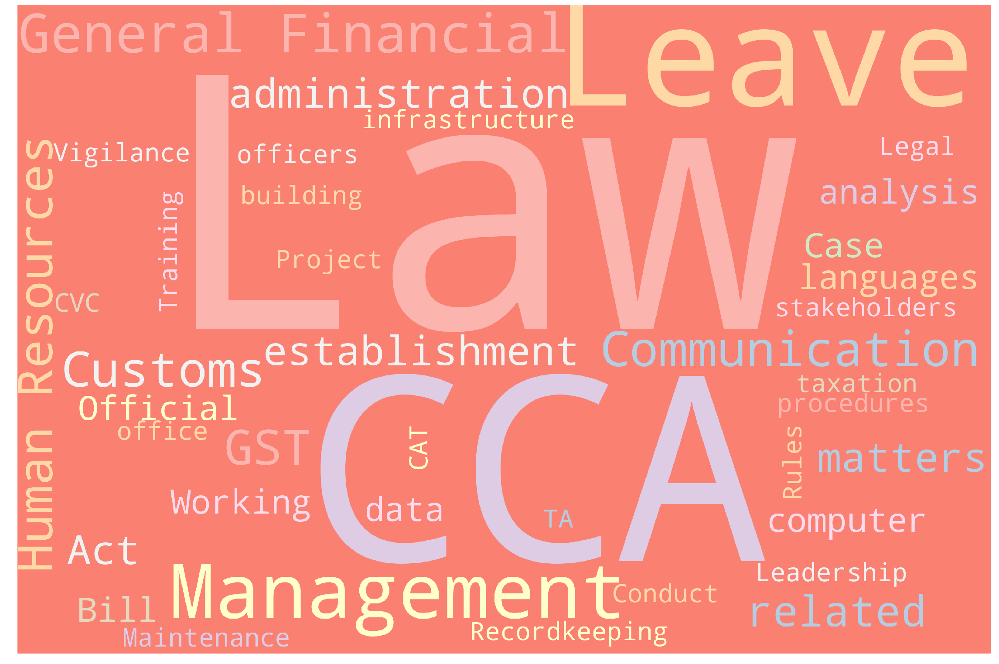

Central Bureau of Narcotics Govt. Of India, Ministry of Finance, Department of Revenue


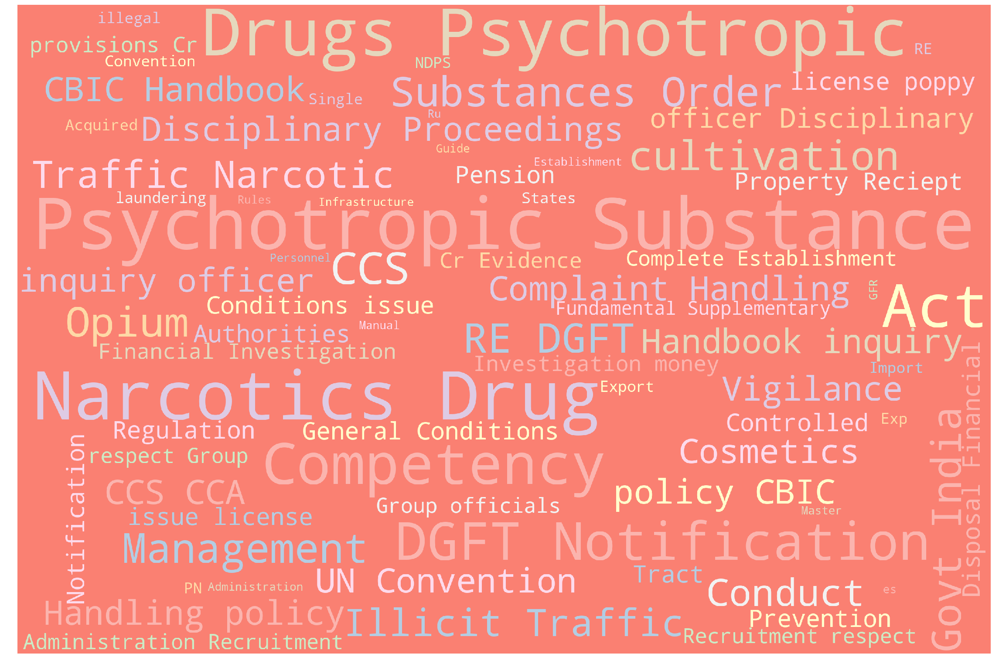

Central Revenues Control Laboratory,
Govt. of
India, Ministry of Finance, Department of Revenue under CBIC



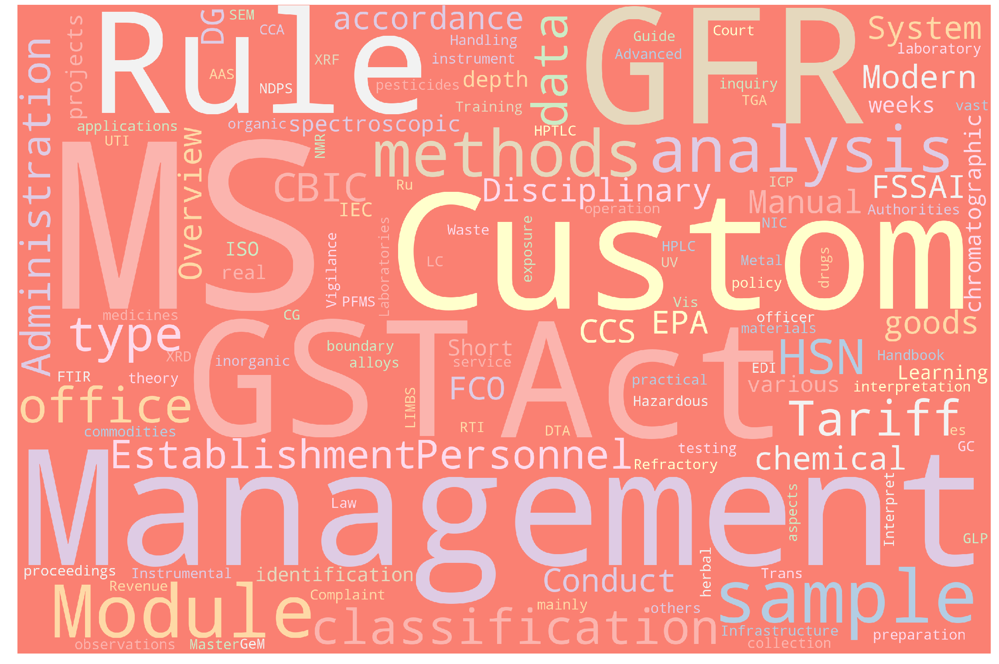

Central Revenues Control Laboratory, Govt. of India, Ministry of Finance, Department of Revenue under CBIC


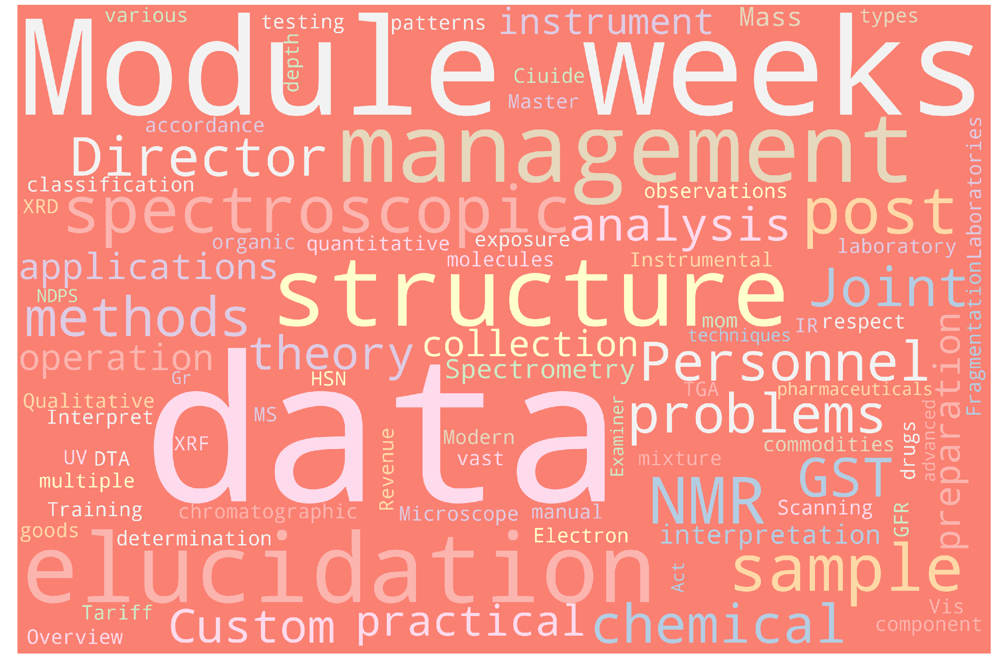

Directorate Geeral of Logistics


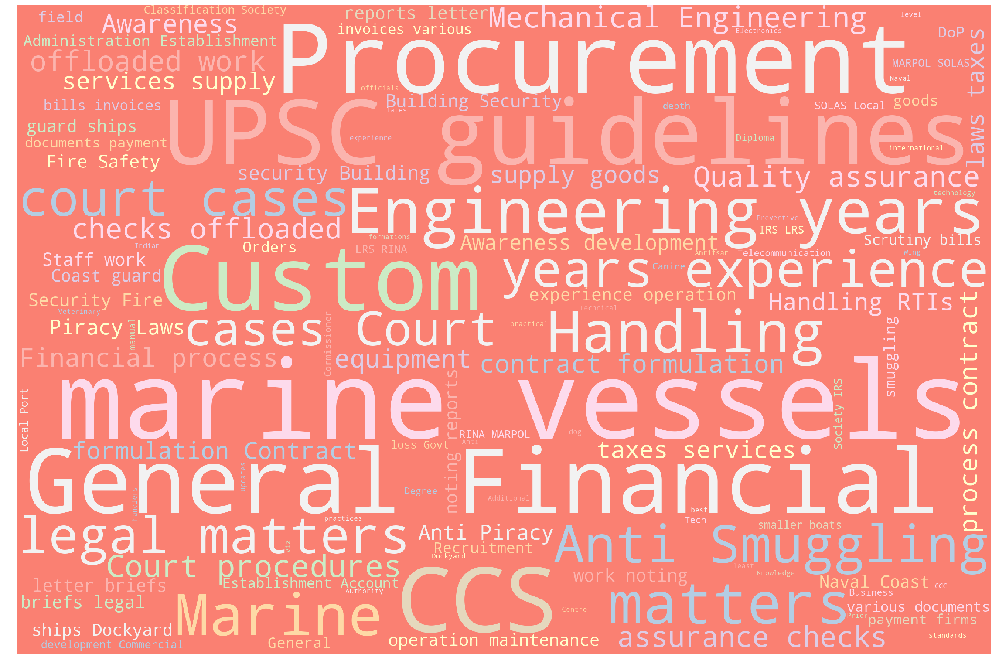

Directorate General of Anti-profiteering


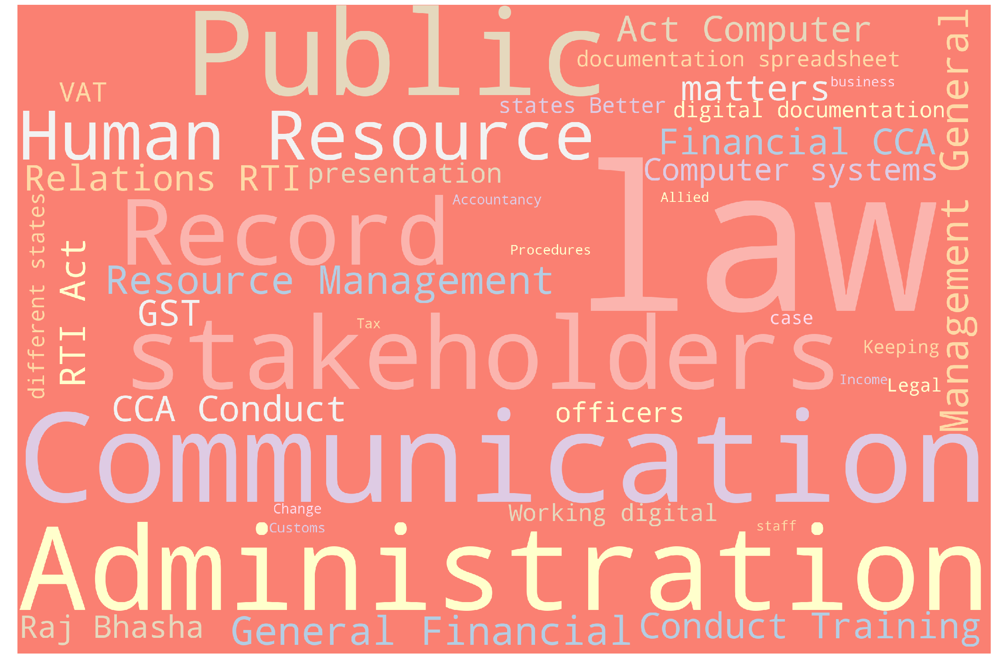

Directorate of Systems West Zonal Unit, Mumbai.


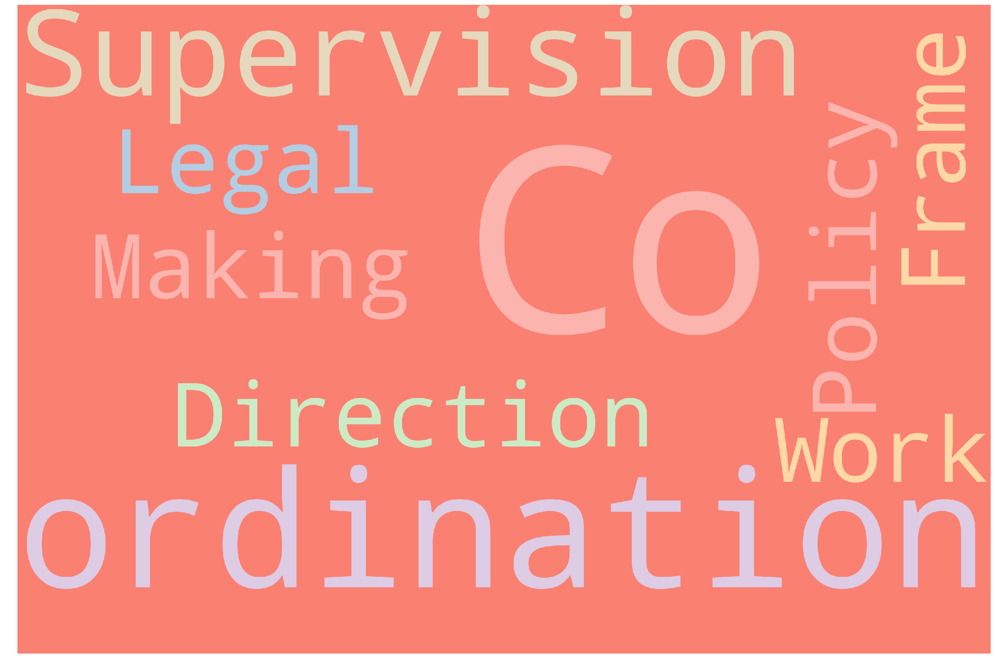

Directorate General of Valuation


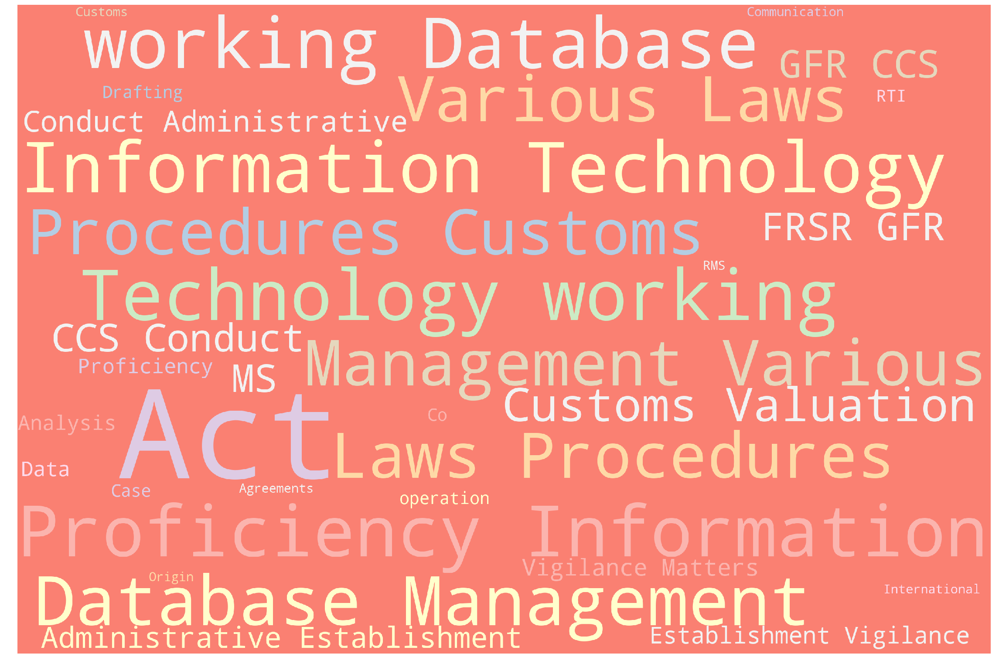

Directorate General of Vigilance


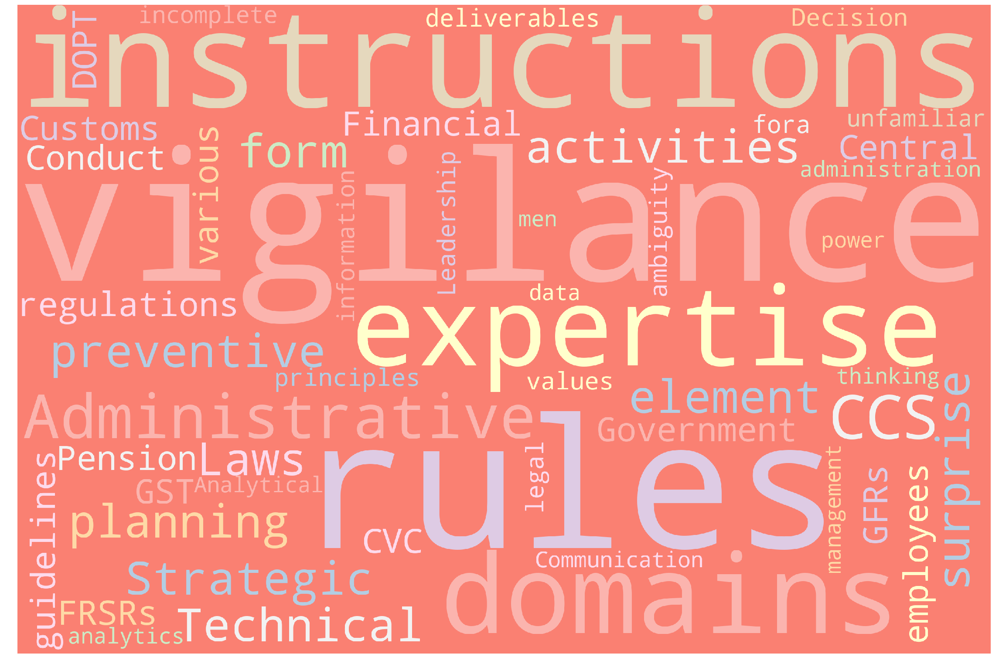

Central Excise and Service tax settlement commission


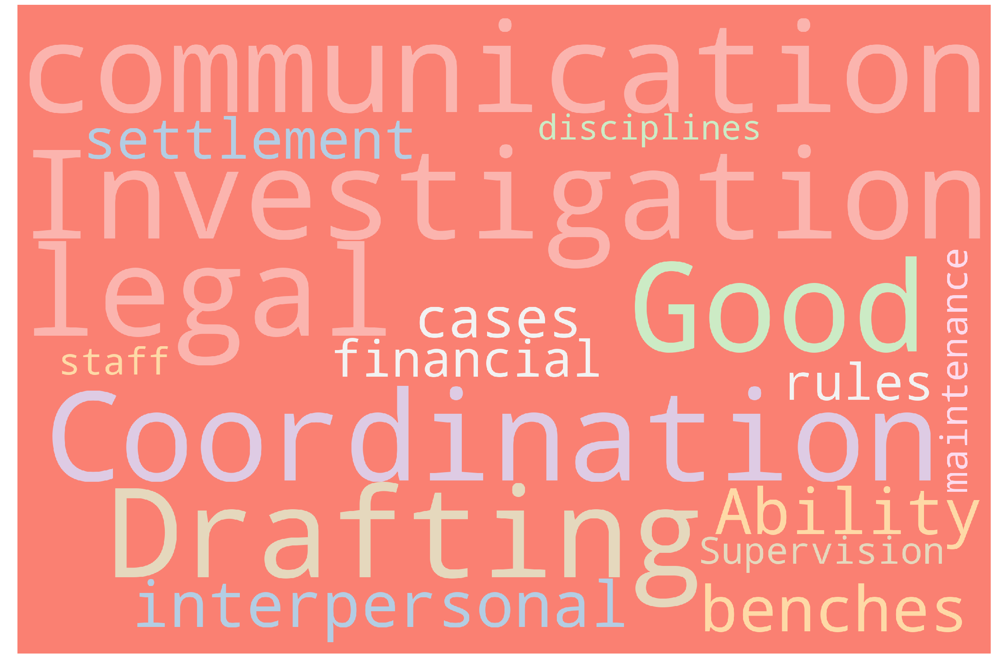

Directorate General of GST Intelligence


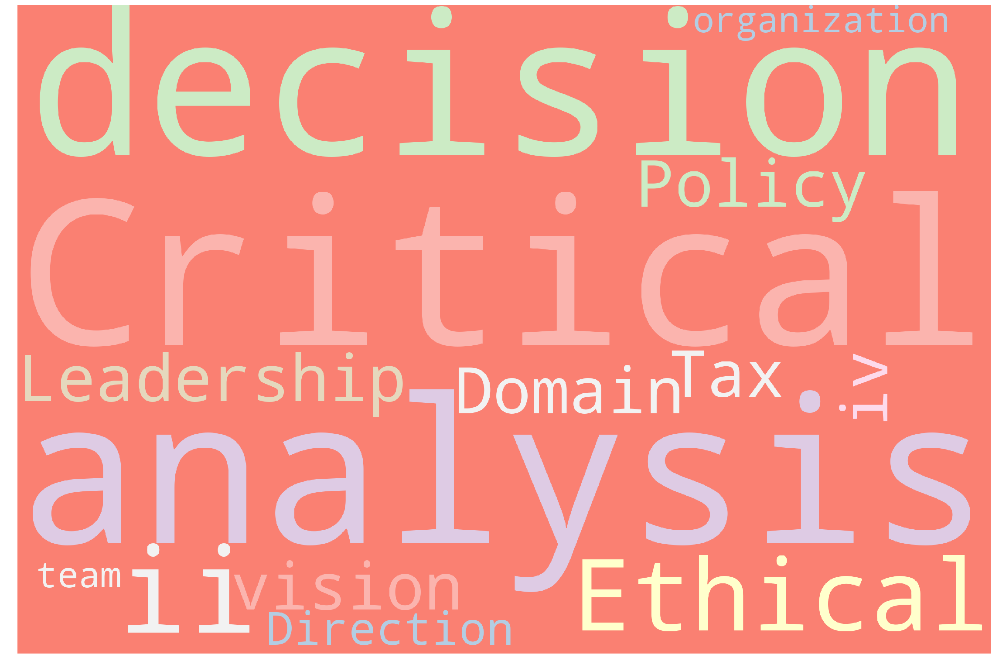

Head of Department


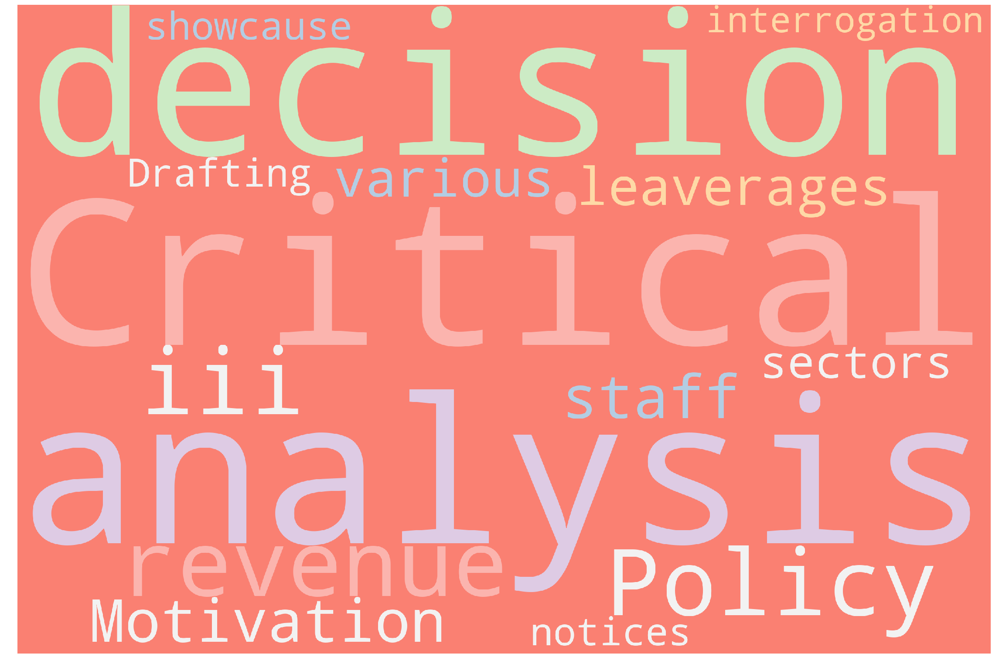

Adjudication Section


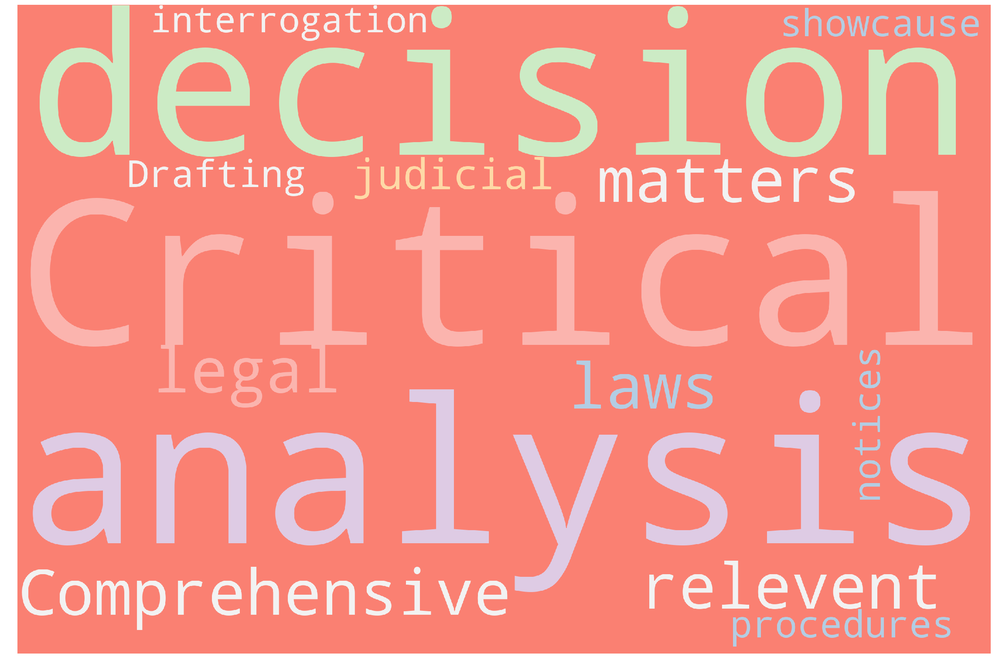

Intelligence Section


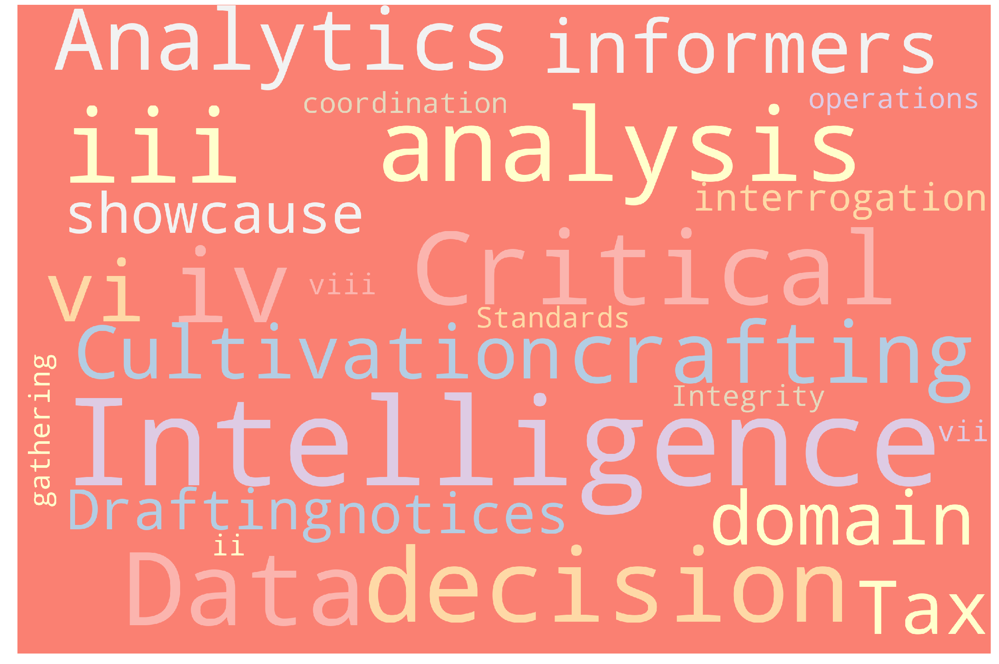

Investigation Section


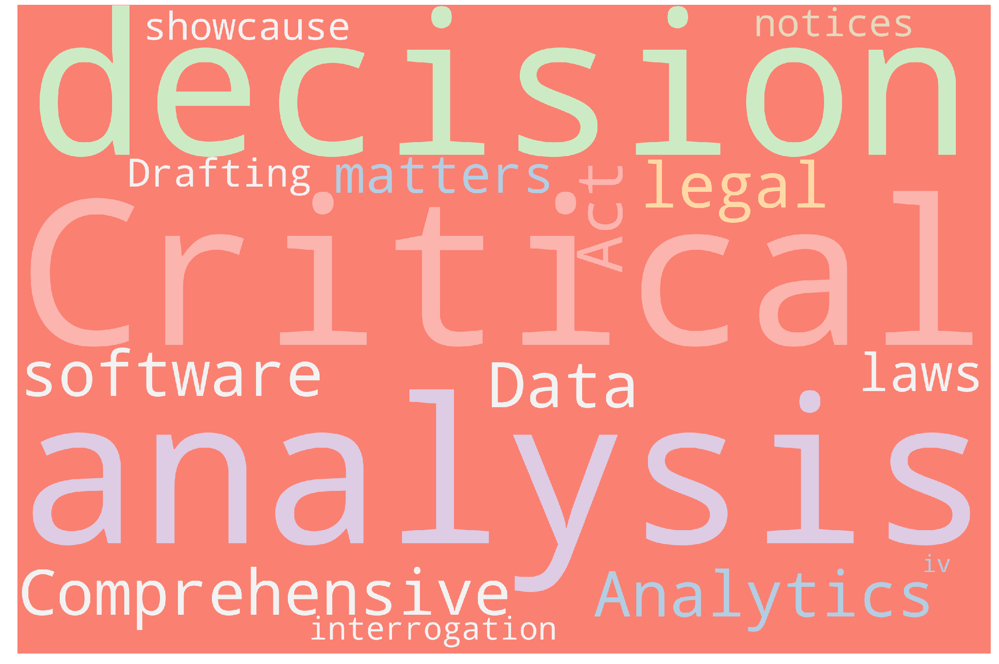

Machine Intelligence Unit


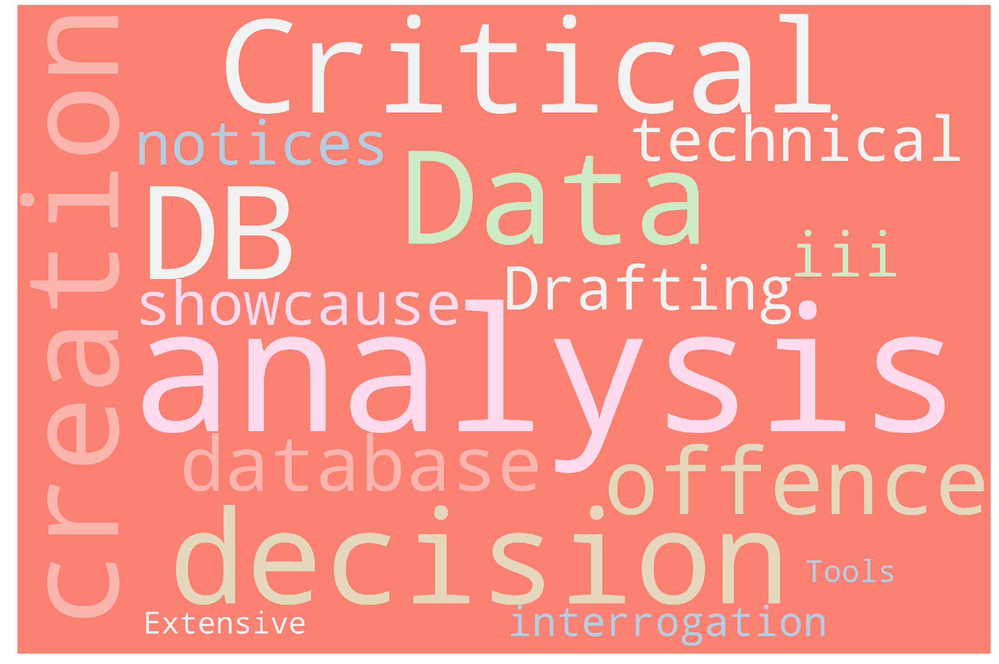

Policy Section


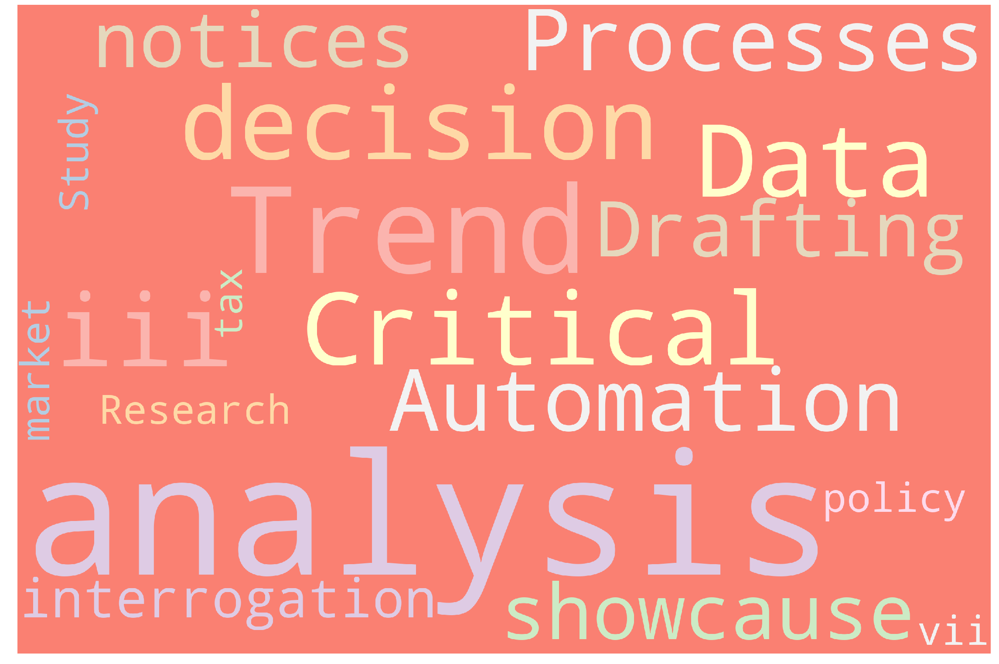

Administration & Accounts Section


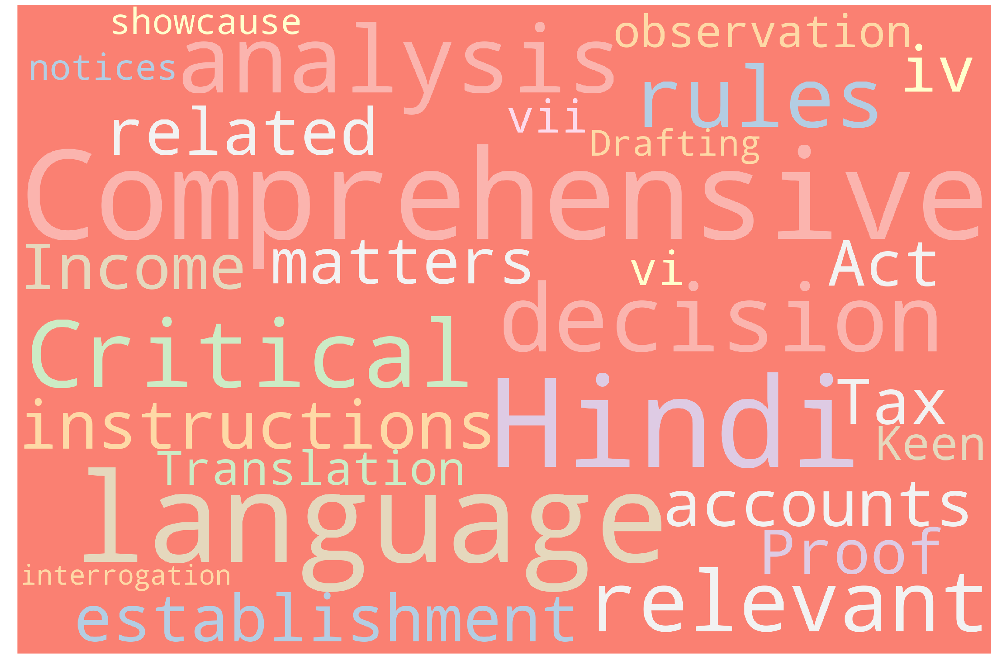

Directorate General of Export Promotion


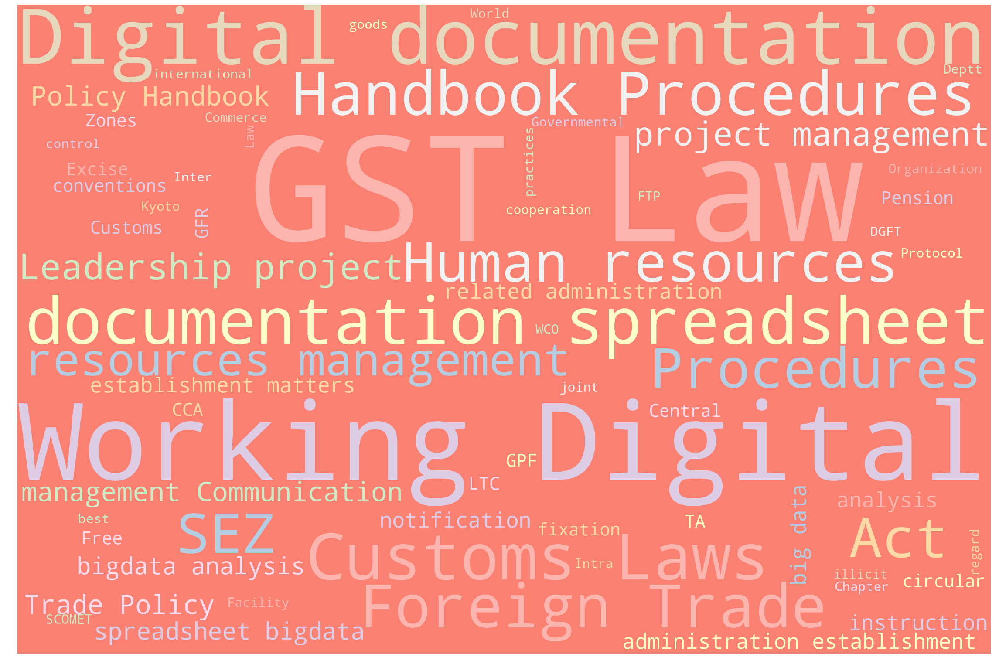

In [51]:
#Within Directorate
for directorate in combine_data.type_of_formation.unique():
    print(directorate)
    generate_word_cloud(combine_data[combine_data.type_of_formation==directorate].reset_index(drop="yes"),"domain_competencies")
    plt.show()
    

In [1]:
##Across Directorate
generate_word_cloud(combine_data,"domain_competencies")

NameError: name 'generate_word_cloud' is not defined

# WIP

In [84]:
import numpy as np
import seaborn as sns
from apyori import apriori

In [85]:
amd=[]
input_text=" ".join(list(combine_data.domain_competencies))
input_text=clean(input_text)
for raw in combine_data.domain_competencies:
    amd.append(remove_stopwords(clean(raw).split(" ")))
    

In [86]:
asso = apriori(amd, min_support=0.005, min_confidence=0.5, min_lift=3)

In [ ]:
association_results = list(asso)

In [ ]:
result=list(asso)
Final_Output=pd.DataFrame()
output=[]
for i in result:
    temp = i[0] # extracting item name
    item=[]
    for j in temp:
        item.append(j)
    #extracting item1, item2, support value, confidence value and lift
    output.append([item[:-1],item[-1],i[1],i[2][0][2],i[2][0][3]]) 
# creating Dataframe    
Final_Output=pd.DataFrame(output,columns=["rhs","lhs","Support","Confidence","Lift"])